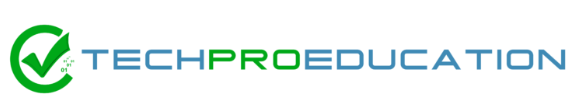

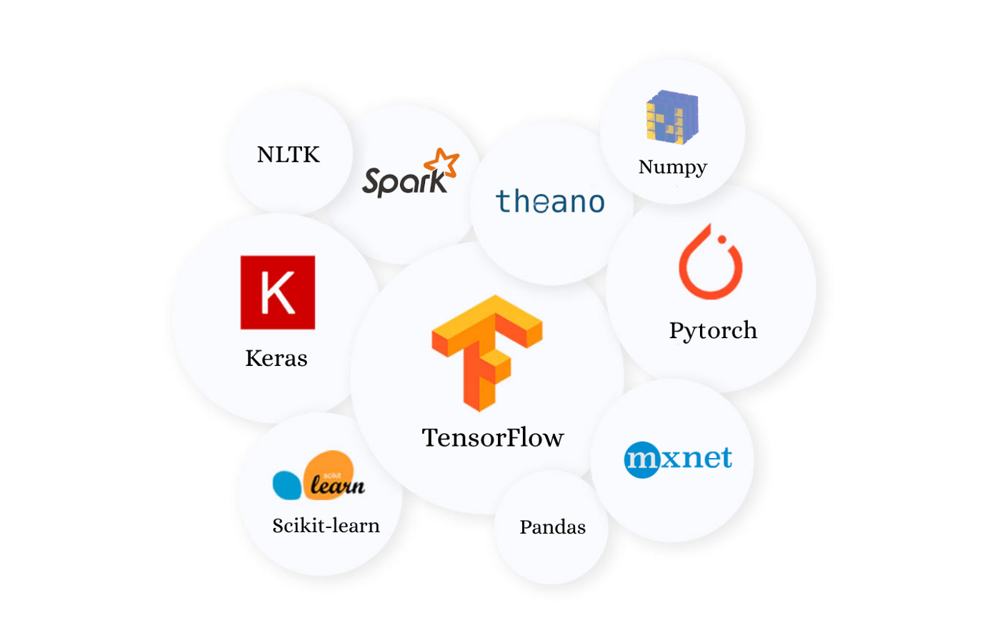

In [ ]:
# dropout fully connected olmamasi icin, ona 0.5 yazarsan yarisi calisiyor
#büyük datalarda fayda sagliyor, kücük datalarda bek fayda vermiyor.overfitting'i engellemeye yardimci oluyor

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

plt.rcParams["figure.figsize"] = (10,6)

sns.set_style("whitegrid")
pd.set_option('display.float_format', lambda x: '%.3f' % x)

# Set it None to display all rows in the dataframe
# pd.set_option('display.max_rows', None)

# Set it to None to display all columns in the dataframe
pd.set_option('display.max_columns', None)

In [2]:
!pip install folium 

# python kullanarak haritalar üzerinde islemler yapiliyor,bir kütüphane
# 


[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

#google colab icin

In [4]:
#df = pd.read_csv("drive/MyDrive/Colab_Files/data/kc_house_data.csv")

In [5]:
df = pd.read_csv("kc_house_data.csv")

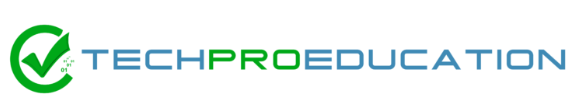

## Exploratory Data Analysis and Visualization

In [6]:
df.head()

#lat ve long enlem ve boylem degerleri
# lattitude ,longitude

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650
1,6414100192,12/9/2014,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639
2,5631500400,2/25/2015,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062
3,2487200875,12/9/2014,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000
4,1954400510,2/18/2015,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503


We will be using data from a Kaggle data set:

https://www.kaggle.com/harlfoxem/housesalesprediction

#### Feature Columns
    
* id - Unique ID for each home sold
* date - Date of the home sale
* price - Price of each home sold
* bedrooms - Number of bedrooms
* bathrooms - Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* sqft_living - Square footage of the apartments interior living space
* sqft_lot - Square footage of the land space
* floors - Number of floors
* waterfront - A dummy variable for whether the apartment was overlooking the waterfront or not
* view - An index from 0 to 4 of how good the view of the property was
* condition - An index from 1 to 5 on the condition of the apartment,
* grade - An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design.
* sqft_above - The square footage of the interior housing space that is above ground level
* sqft_basement - The square footage of the interior housing space that is below ground level
* yr_built - The year the house was initially built
* yr_renovated - The year of the house’s last renovation
* zipcode - What zipcode area the house is in
* lat - Lattitude
* long - Longitude
* sqft_living15 - The square footage of interior housing living space for the nearest 15 neighbors
* sqft_lot15 - The square footage of the land lots of the nearest 15 neighbors

In [7]:
df.info()

#21597 normalde büyük gibi ama DL nin cok sevmedigi datalar

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     21597 non-null  int64  
 9   view           21597 non-null  int64  
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  int64  
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   21597 non-null  int64  
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [8]:
df.isnull().sum().any()

False

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.000,4580474287.771,2876735715.748,1000102.000,2123049175.000,3904930410.000,7308900490.000,9900000190.000
price,21597.000,540296.574,367368.140,78000.000,322000.000,450000.000,645000.000,7700000.000
bedrooms,21597.000,3.373,0.926,1.000,3.000,3.000,4.000,33.000
bathrooms,21597.000,2.116,0.769,0.500,1.750,2.250,2.500,8.000
sqft_living,21597.000,2080.322,918.106,370.000,1430.000,1910.000,2550.000,13540.000
sqft_lot,21597.000,15099.409,41412.637,520.000,5040.000,7618.000,10685.000,1651359.000
floors,21597.000,1.494,0.540,1.000,1.000,1.500,2.000,3.500
waterfront,21597.000,0.008,0.087,0.000,0.000,0.000,0.000,1.000
view,21597.000,0.234,0.766,0.000,0.000,0.000,0.000,4.000
condition,21597.000,3.410,0.651,1.000,3.000,3.000,4.000,5.000


### İd_number

In [10]:
df = df.drop('id', axis = 1)  #id lazim degil

### price

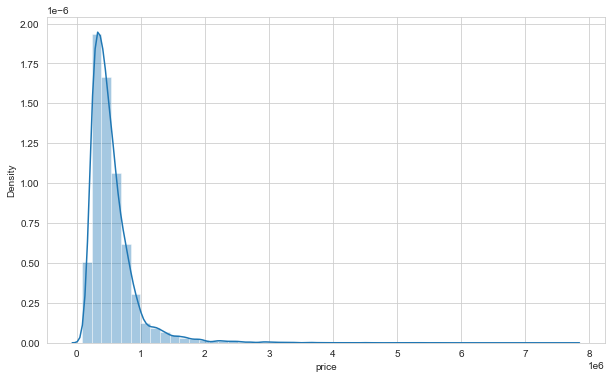

In [11]:
sns.distplot(df['price']);

# 

In [12]:
df[df["price"] > 3000000].sort_values(by="price", ascending=False)

#3000000 den büyüklere bakiyoruz, fikir edinmek icin yapiyoruz

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7245,10/13/2014,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,98102,47.630,-122.323,3940,8800
3910,6/11/2014,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,98004,47.650,-122.214,3930,25449
9245,9/19/2014,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,98039,47.630,-122.240,4540,42730
4407,8/4/2014,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,98039,47.629,-122.233,3560,24345
1446,4/13/2015,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,98004,47.623,-122.220,4600,21750
1313,4/13/2015,5300000.000,6,6.000,7390,24829,2.000,1,4,4,12,5000,2390,1991,0,98040,47.563,-122.210,4320,24619
1162,10/20/2014,5110000.000,5,5.250,8010,45517,2.000,1,4,3,12,5990,2020,1999,0,98033,47.677,-122.211,3430,26788
8085,6/17/2014,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,98040,47.557,-122.210,3270,10454
2624,8/15/2014,4500000.000,5,5.500,6640,40014,2.000,1,4,3,12,6350,290,2004,0,98155,47.749,-122.280,3030,23408
8629,6/18/2014,4490000.000,4,3.000,6430,27517,2.000,0,0,3,12,6430,0,2001,0,98004,47.621,-122.219,3720,14592


In [13]:
df.groupby("waterfront").mean().T

waterfront,0,1
price,531762.324,1662524.184
bedrooms,3.374,3.301
bathrooms,2.112,2.678
sqft_living,2072.007,3173.687
sqft_lot,15021.290,25371.828
floors,1.493,1.641
view,0.207,3.767
condition,3.409,3.534
grade,7.649,8.773
sqft_above,1783.392,2473.043


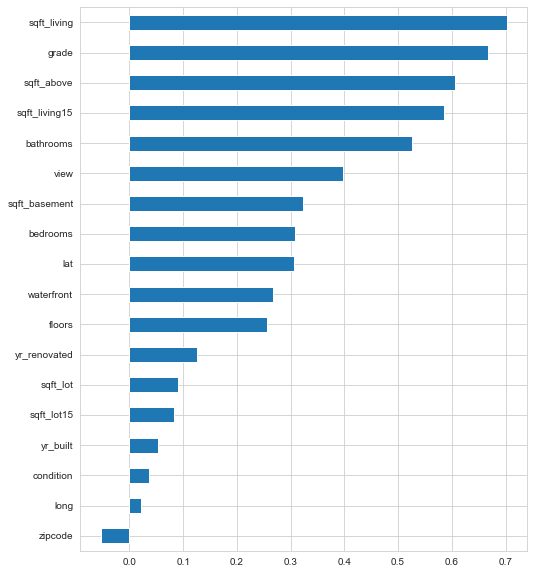

In [14]:
plt.figure(figsize = (8,10))
df.corr()["price"].sort_values().drop("price").plot(kind = "barh");

# preis'in yuksek olmasina katki saglayan özelliklerin büyükten kücüge siralanmasi
# her biri price'a göre karsilastirarak bulunmus,bir üstteki kod ile

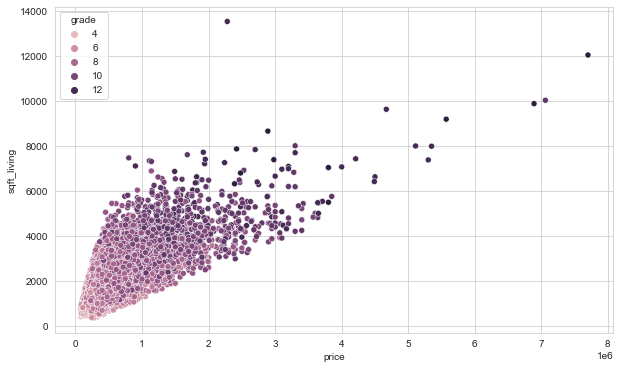

In [15]:
sns.scatterplot(x = 'price',y = 'sqft_living', data = df, hue = "grade");

#price ve evin büyüklügü ile ilgili iliski
#yukarida bu iliski yüksek cikmisti

### bedrooms

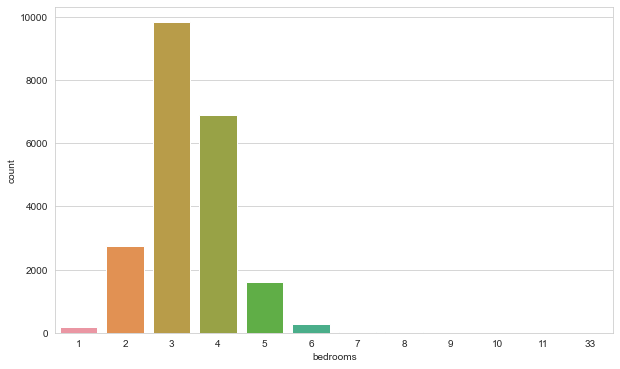

In [16]:
sns.countplot(df['bedrooms']);

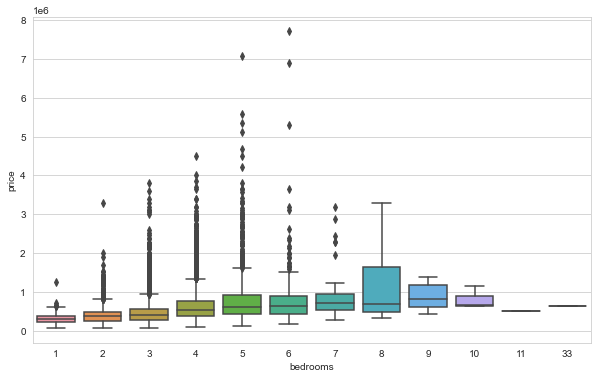

In [17]:
sns.boxplot(x = 'bedrooms', y = 'price', data = df);

# oda sayisi ile price iliskisi

In [18]:
df[df["bedrooms"] > 10]

# burda iki tane ev varmis, burda bir görelim dedik

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8748,8/21/2014,520000.000,11,3.000,3000,4960,2.000,0,0,3,7,2400,600,1918,1999,98106,47.556,-122.363,1420,4960
15856,6/25/2014,640000.000,33,1.750,1620,6000,1.000,0,0,5,7,1040,580,1947,0,98103,47.688,-122.331,1330,4700


In [19]:
df = df[df["bedrooms"] != 33]

#33 olani datamizdan cikaralim, gercek gibi durmuyor, outlier gibi duruyor

Most likely the data was entered incorrectly.

In [20]:
df.shape

(21596, 20)

### date

In [21]:
df['date'].dtype

dtype('O')

In [22]:
df['date'] = pd.to_datetime(df['date'])

#date olarak cevirmeliyiz

In [23]:
df['date']

0       2014-10-13
1       2014-12-09
2       2015-02-25
3       2014-12-09
4       2015-02-18
           ...    
21592   2014-05-21
21593   2015-02-23
21594   2014-06-23
21595   2015-01-16
21596   2014-10-15
Name: date, Length: 21596, dtype: datetime64[ns]

In [24]:
df['year'] = df['date'].dt.year
#df['year'] = df['date'].apply(lambda date : date.year)

In [25]:
df['month'] = df['date'].dt.month

#yil ve aylari ayri bir sütun olarak görmek istiyorz

In [26]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2


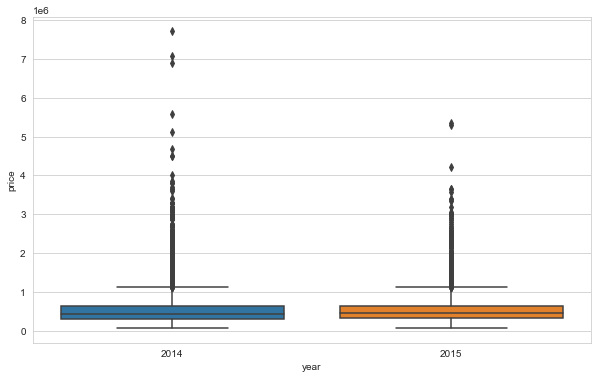

In [27]:
sns.boxplot(x = 'year', y = 'price', data = df);

#2014 ile 1015 ule yillarindaki ev fiyqtlari birbirine yakinmis dedi hoca ama ,anlamadim

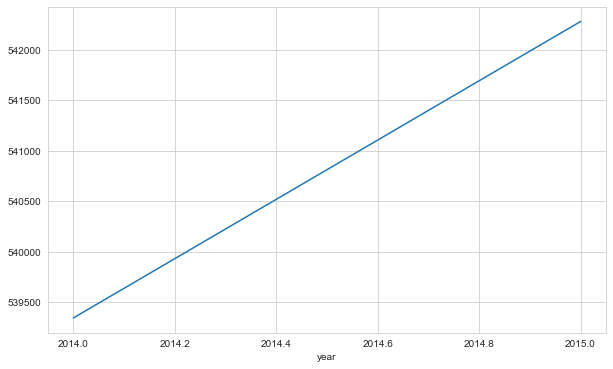

In [28]:
df.groupby('year')['price'].mean().plot();

#evlerin fiyat oranlari, bunlar datayi taniyalim diye

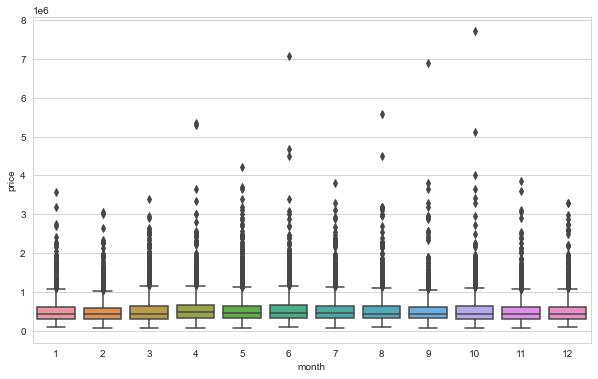

In [29]:
sns.boxplot(x = 'month', y = 'price', data = df);

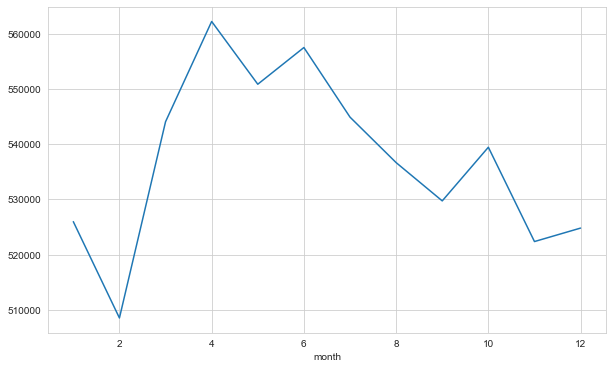

In [30]:
df.groupby('month')['price'].mean().plot();

#aylara göre grupladik, bahar aylarinda evler daha yüksek fiyata satiliyor

In [31]:
month_dummy = pd.get_dummies(df["month"], prefix = "month")
df = pd.concat([df, month_dummy], axis = 1)
df.head()


#aylari get dummies ile aliyoruz
#encoder olarakta yapabiliriz, 

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,2014-10-13,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,98178,47.511,-122.257,1340,5650,2014,10,0,0,0,0,0,0,0,0,0,1,0,0
1,2014-12-09,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,98125,47.721,-122.319,1690,7639,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
2,2015-02-25,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,98028,47.738,-122.233,2720,8062,2015,2,0,1,0,0,0,0,0,0,0,0,0,0
3,2014-12-09,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,98136,47.521,-122.393,1360,5000,2014,12,0,0,0,0,0,0,0,0,0,0,0,1
4,2015-02-18,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,98074,47.617,-122.045,1800,7503,2015,2,0,1,0,0,0,0,0,0,0,0,0,0


In [32]:
df = df.drop(['date', "year", "month"], axis = 1)
#ilk sütunlari almiyoruz, aslinda hoca firs_drop yapsa gidecekti zaten

### zipcode

In [33]:
df['zipcode'].value_counts(dropna = False)

# enlem ve boylam oldugu icin buna gerek kalmadi

98103    601
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

we can categorize the zipcodes as north, south, west, east, middle by regions. But it can be made manually and taken many time and we need domain knowladge to do that. So we will drop this column.

In [34]:
df = df.drop('zipcode', axis = 1)

### yr_renovated & yr_built

In [35]:
df['yr_renovated'].value_counts(dropna = False)

# buda renove edilmis columns cogu nan ve pekte faydali olmadigi icin drop ediliyor

0       20682
2014       91
2013       37
2003       36
2005       35
        ...  
1951        1
1959        1
1948        1
1954        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [36]:
df['yr_built'].value_counts(dropna = False)
#buda drop ediyoruz

2014    559
2006    453
2005    450
2004    433
2003    420
       ... 
1933     30
1901     29
1902     27
1935     24
1934     21
Name: yr_built, Length: 116, dtype: int64

could make sense due to scaling, higher should correlate to more value

### sqft_basement

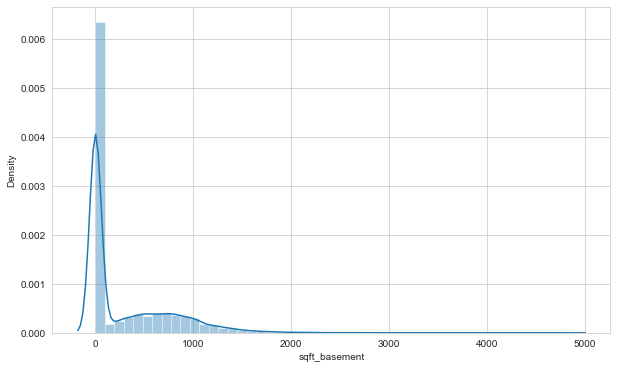

In [37]:
sns.distplot(df['sqft_basement']);

#bunlarada bakalim demisler,bodrumun metrekaresi

In [38]:
df['sqft_basement'].value_counts(dropna = False)

0      13110
600      221
700      218
500      214
800      206
       ...  
518        1
374        1
784        1
906        1
248        1
Name: sqft_basement, Length: 306, dtype: int64

In [39]:
df[df["sqft_basement"] > 3000].sort_values(by="sqft_basement", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
8085,4670000.000,5,6.750,9640,13068,1.000,1,4,3,12,4820,4820,1983,2009,47.557,-122.210,3270,10454,0,0,0,0,0,1,0,0,0,0,0,0
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
15468,3200000.000,4,3.250,7000,28206,1.000,1,4,4,12,3500,3500,1991,0,47.593,-122.086,4913,14663,0,0,0,0,0,0,0,1,0,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
10074,1900000.000,5,4.250,6510,16471,2.000,0,3,4,11,3250,3260,1980,0,47.576,-122.242,4480,16471,0,0,0,0,0,0,0,0,1,0,0,0


could make sense due to scaling, higher should correlate to more value

### sqft_above

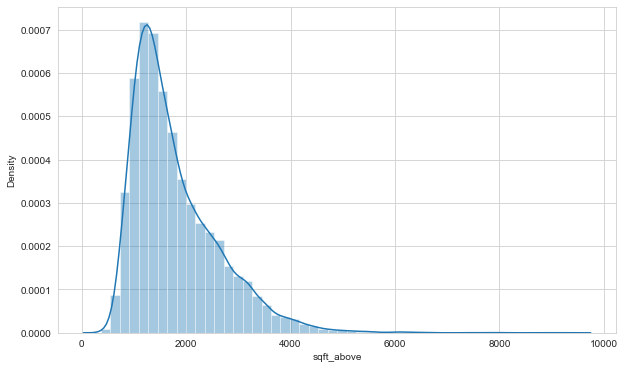

In [40]:
sns.distplot(df['sqft_above']);

In [41]:
df['sqft_above'].value_counts(dropna = False)

1300    212
1010    210
1200    206
1220    192
1140    184
       ... 
3674      1
2979      1
2382      1
6290      1
1425      1
Name: sqft_above, Length: 942, dtype: int64

In [42]:
df[df["sqft_above"] > 6000].sort_values(by="sqft_above", ascending=False)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
12764,2280000.000,7,8.000,13540,307752,3.000,0,4,3,12,9410,4130,1999,0,47.667,-121.986,4850,217800,0,0,0,0,1,0,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
18288,3300000.000,5,6.250,8020,21738,2.000,0,0,3,11,8020,0,2001,0,47.568,-122.189,4160,18969,0,0,0,0,0,0,1,0,0,0,0,0
13398,2420000.000,5,4.750,7880,24250,2.000,0,2,3,13,7880,0,1996,0,47.733,-122.362,2740,10761,1,0,0,0,0,0,0,0,0,0,0,0
19842,2700000.000,4,4.000,7850,89651,2.000,0,0,3,12,7850,0,2006,0,47.541,-121.982,6210,95832,1,0,0,0,0,0,0,0,0,0,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
11859,1950000.000,4,3.250,7420,167869,2.000,0,3,3,12,7420,0,2002,0,47.455,-121.764,5610,169549,1,0,0,0,0,0,0,0,0,0,0,0
18579,1140000.000,5,4.000,7320,217800,2.000,0,0,3,11,7320,0,1992,0,47.447,-122.086,3270,34500,0,0,0,0,0,0,1,0,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0


### Geographical Properties

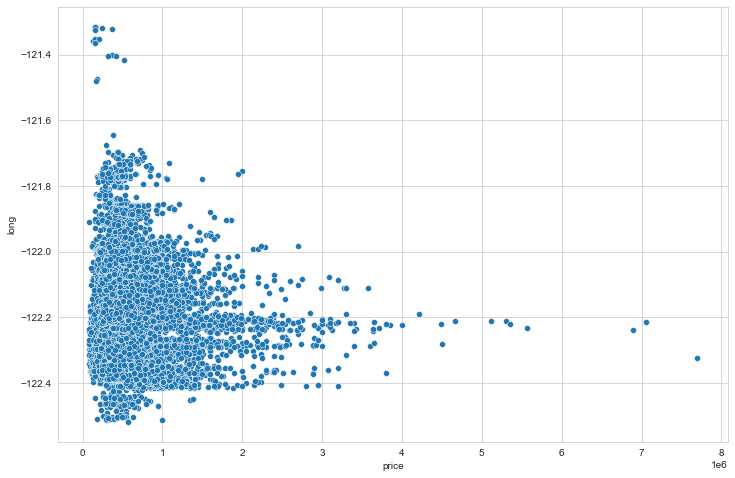

In [43]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'price', y = 'long', data = df);

#boylam ve price arasindaki iliskiye bakarsak


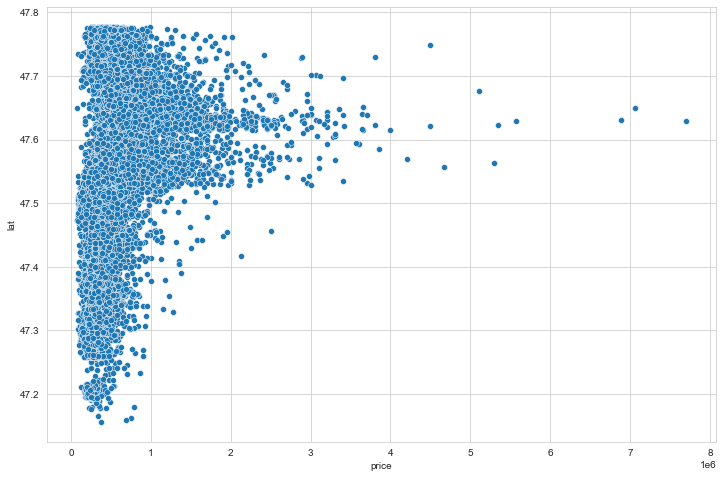

In [44]:
plt.figure(figsize  = (12, 8))
sns.scatterplot(x = 'price', y = 'lat', data = df);

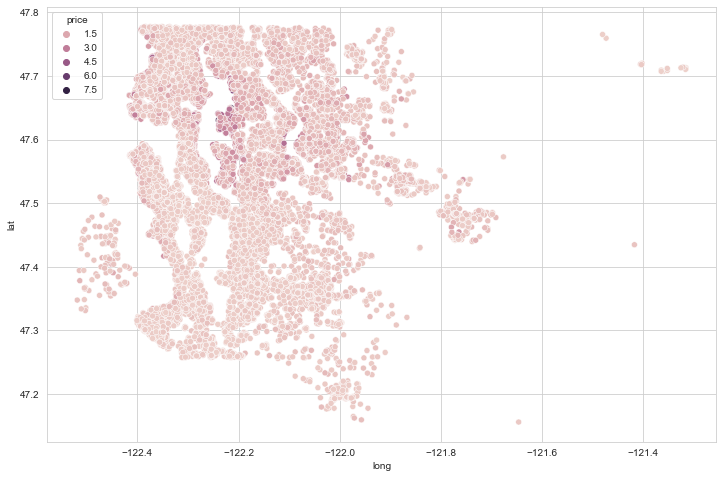

In [45]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = df, hue = 'price');

#burda evlerin harita üzerindeki konumlarini görüyoruz.
#yüksek fiyatli 

In [46]:
len(df) * (0.01)

215.96

In [47]:
df.sort_values('price', ascending = False).head(216)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
7245,7700000.000,6,8.000,12050,27600,2.500,0,3,4,13,8570,3480,1910,1987,47.630,-122.323,3940,8800,0,0,0,0,0,0,0,0,0,1,0,0
3910,7060000.000,5,4.500,10040,37325,2.000,1,2,3,11,7680,2360,1940,2001,47.650,-122.214,3930,25449,0,0,0,0,0,1,0,0,0,0,0,0
9245,6890000.000,6,7.750,9890,31374,2.000,0,4,3,13,8860,1030,2001,0,47.630,-122.240,4540,42730,0,0,0,0,0,0,0,0,1,0,0,0
4407,5570000.000,5,5.750,9200,35069,2.000,0,0,3,13,6200,3000,2001,0,47.629,-122.233,3560,24345,0,0,0,0,0,0,0,1,0,0,0,0
1446,5350000.000,5,5.000,8000,23985,2.000,0,4,3,12,6720,1280,2009,0,47.623,-122.220,4600,21750,0,0,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7408,1980000.000,6,4.500,4800,9097,2.000,0,0,3,10,3580,1220,2007,0,47.626,-122.291,2180,6037,0,0,0,0,0,0,1,0,0,0,0,0
16511,1980000.000,4,3.500,4500,44384,1.000,0,0,3,12,3340,1160,1990,0,47.632,-122.192,2540,26287,0,1,0,0,0,0,0,0,0,0,0,0
19513,1980000.000,4,4.000,4360,12081,2.000,0,0,3,10,4360,0,2007,0,47.638,-122.219,2180,10800,0,0,0,0,0,0,0,1,0,0,0,0
3278,1970000.000,5,3.750,3940,13738,1.500,0,3,4,9,3940,0,1951,0,47.620,-122.212,2370,13320,0,1,0,0,0,0,0,0,0,0,0,0


In [48]:
non_top_1_perc = df.sort_values('price', ascending = False).iloc[216:]

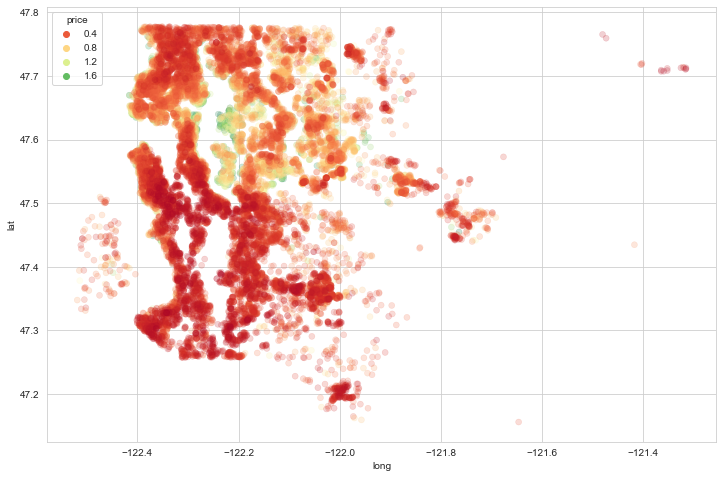

In [49]:
plt.figure(figsize = (12, 8))
sns.scatterplot(x = 'long', y = 'lat', data = non_top_1_perc, hue = 'price',
                palette = 'RdYlGn', edgecolor = None, alpha = 0.2);

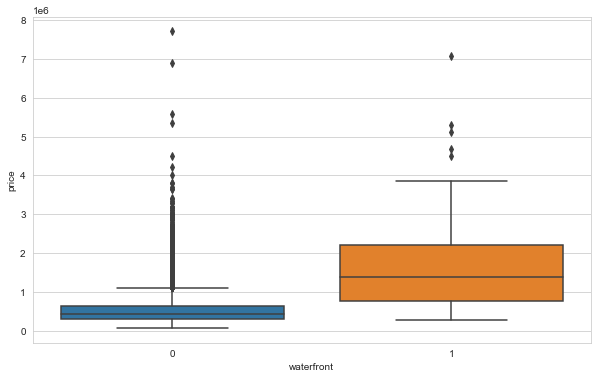

In [50]:
sns.boxplot(x = 'waterfront', y = 'price', data = df);

In [51]:
pip install folium

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [52]:
import folium
import branca.colormap as cm

In [53]:
folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start=10)

#bizim enlem ve boylam degerlerine göre harita cikiyor

In [54]:
step_1 = df.price.min()
step_2 = df.price.quantile(0.25)
step_3 = df.price.quantile(0.50)
step_4 = df.price.quantile(0.75)
step_5 = df.price.max()

In [55]:
m = folium.Map(location=[df["lat"].mean(), df["long"].mean()], zoom_start = 10)
colormap = cm.StepColormap(colors=["green","yellow","orange","red"] ,
                           index=[step_1, step_2, step_3, step_4, step_5],
                           vmin=step_1,
                           vmax=step_5)
for loc, p in zip(zip(df['lat'], df['long']),df["price"]):
      folium.Circle(
      location=loc,
      radius=1, #yarıçap
      fill=True, 
      color=colormap(p)
      ).add_to(m)
m
#bu kodla. koordinatlari bilinen evlerin konumlarini görüyoruz

### latest data

In [56]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,221900.000,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0
1,538000.000,3,2.250,2570,7242,2.000,0,0,3,7,2170,400,1951,1991,47.721,-122.319,1690,7639,0,0,0,0,0,0,0,0,0,0,0,1
2,180000.000,2,1.000,770,10000,1.000,0,0,3,6,770,0,1933,0,47.738,-122.233,2720,8062,0,1,0,0,0,0,0,0,0,0,0,0
3,604000.000,4,3.000,1960,5000,1.000,0,0,5,7,1050,910,1965,0,47.521,-122.393,1360,5000,0,0,0,0,0,0,0,0,0,0,0,1
4,510000.000,3,2.000,1680,8080,1.000,0,0,3,8,1680,0,1987,0,47.617,-122.045,1800,7503,0,1,0,0,0,0,0,0,0,0,0,0


In [57]:
df.shape

#dummies yapinca columns sayisi artti

(21596, 30)

## Preprocessing of Data
- Train | Test Split, Scalling

In [58]:
from sklearn.model_selection import train_test_split

In [59]:
X = df.drop('price', axis = 1)
y = df['price']

#burda values yapilmamis, ama burda yapilsada olurmus, büyük datalarda values yapilmasi daha iyi

In [60]:
seed = 101
# hocayla ve bizin ayni data setini alalim diye, biz ve hocada ayni bias degerlerini alacaz
# herkez ayni data ve ayni agirlik degerleriyle ögrenecek


In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=seed)

In [62]:
from sklearn.preprocessing import MinMaxScaler  # RobustScaler()

# If there are too many outliers in the data, robust scaler should be used, otherwise minmax can be used.
#datanin icinde cok fazla outlier varsa Robustscaler kullanilmasi daha iyi olur

In [63]:
scaler = MinMaxScaler()

In [64]:
X_train= scaler.fit_transform(X_train)  #train datasini fit_transform yapiyoruz
X_test = scaler.transform(X_test)

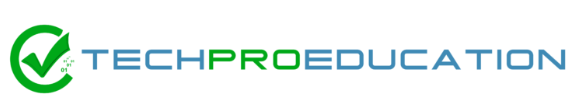

## Modelling & Model Performance

In [65]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

In [66]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score

# explained ve r2 birbiylerine cok benzeyen seyler

In [67]:
def eval_metric(actual, pred):
    mae = mean_absolute_error(actual, pred)
    mse = mean_squared_error(actual, pred)
    rmse = np.sqrt(mean_squared_error(actual, pred))
    score = r2_score(actual, pred)
    return print("r2_score:", score, "\nmae:", mae, "\nmse:", mse, "\nrmse:", rmse)

In [68]:
X_train.shape

#

(19436, 29)

In [69]:
tf.random.set_seed(seed)

model = Sequential()   #sirali olarak birbirini takip edecek anlamina geliyor

model.add(Dense(29, activation = 'relu'))   #bu modeli layer layer olarak,
#model.add(Activation("relu")) # Activation function can be added separately as a different line after each layer.  
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))   #buraya activation fonksiyonu koymadik cünkü linear regression problemi oldugu icin

model.compile(optimizer = 'adam', loss = 'mse')  # dün adam degil baska bir optimizer kullandik

# optimazir backpropagationi calistiran parametre

#burda 4 tane hidden layer secilecek
# her bir layerda 29 tane nöron var diyebiliirz
# burda deneyerek iyi olan deger bilunabilir
# 

In [70]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

#validation_split - %90 diye train ayirmistik. train icinden %15lik bir bölümü alip,
# orda kendi validation islemini yapiyor

#epoch burda yüksek secilmis

# asagida 130 burdaki iteration sayisi oluyor, yani pakatler 130 defa modele girince bir epoch oluyordu
# val_loss yukardaki validation_split ile kendini degerlendirip aldigi hata miktarini  gösteriyor
# loss ise zaten cost function demekti, orda ortaya cikan hata miktaridir

# epoch = 6 daki sonuclar tam o 6inci epochta kadarki gelinen sonuclar anlaminda diyebiliriz

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 428612583424.0000 - val_loss: 423995375616.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 428064899072.0000 - val_loss: 422000689152.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 419530276864.0000 - val_loss: 402201968640.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 374767910912.0000 - val_loss: 326337691648.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 262120341504.0000 - val_loss: 190364057600.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 139063623680.0000 - val_loss: 111865782272.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 100212514816.0000 - val_loss: 104871731200.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 97036533760.0000 - val_loss: 103696465920.0000
Epoch 9/1

130/130 [==============================] - 0s 3ms/step - loss: 40185769984.0000 - val_loss: 45813719040.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 39932784640.0000 - val_loss: 45536501760.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 39732641792.0000 - val_loss: 45288910848.0000
Epoch 70/1000
130/130 [==============================] - 0s 2ms/step - loss: 39518232576.0000 - val_loss: 45076750336.0000
Epoch 71/1000
130/130 [==============================] - 0s 2ms/step - loss: 39345250304.0000 - val_loss: 44906237952.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 39121895424.0000 - val_loss: 44549402624.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 38930059264.0000 - val_loss: 44363911168.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 38759600128.0000 - val_loss: 44158611456.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 32852365312.0000 - val_loss: 36761579520.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 32865898496.0000 - val_loss: 36605665280.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 32772300800.0000 - val_loss: 36541554688.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 32720873472.0000 - val_loss: 36413169664.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 32706105344.0000 - val_loss: 36412338176.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 32656838656.0000 - val_loss: 36444348416.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 32635430912.0000 - val_loss: 36284358656.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 32585469952.0000 - val_loss: 36216864768.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 31217618944.0000 - val_loss: 34267373568.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 31179030528.0000 - val_loss: 34180409344.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 31191382016.0000 - val_loss: 34270633984.0000
Epoch 202/1000
130/130 [==============================] - 0s 2ms/step - loss: 31145670656.0000 - val_loss: 34223998976.0000
Epoch 203/1000
130/130 [==============================] - 0s 2ms/step - loss: 31111708672.0000 - val_loss: 34102513664.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 31098468352.0000 - val_loss: 34217095168.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 31100268544.0000 - val_loss: 34242836480.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 31078164480.0000 - val_loss: 34185267200.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 30301466624.0000 - val_loss: 33010620416.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 30284828672.0000 - val_loss: 33001453568.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 30297325568.0000 - val_loss: 33049366528.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 30283565056.0000 - val_loss: 32861054976.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 30256867328.0000 - val_loss: 33181530112.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 30277996544.0000 - val_loss: 33038245888.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 30229813248.0000 - val_loss: 32885590016.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 30228860928.0000 - val_loss: 33051052032.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 29649829888.0000 - val_loss: 32418777088.0000
Epoch 332/1000
130/130 [==============================] - 0s 2ms/step - loss: 29649422336.0000 - val_loss: 32215377920.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 29643497472.0000 - val_loss: 32283928576.0000
Epoch 334/1000
130/130 [==============================] - 0s 2ms/step - loss: 29640683520.0000 - val_loss: 32192073728.0000
Epoch 335/1000
130/130 [==============================] - 0s 2ms/step - loss: 29631500288.0000 - val_loss: 32290949120.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 29608542208.0000 - val_loss: 32062662656.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 29624696832.0000 - val_loss: 32194070528.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 29587564544.0000 - val_loss: 32313161728.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 29111660544.0000 - val_loss: 31673827328.0000
Epoch 398/1000
130/130 [==============================] - 0s 3ms/step - loss: 29121910784.0000 - val_loss: 31695943680.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 29133727744.0000 - val_loss: 31784013824.0000
Epoch 400/1000
130/130 [==============================] - 0s 3ms/step - loss: 29156628480.0000 - val_loss: 31616387072.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 29090809856.0000 - val_loss: 31557443584.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 29092753408.0000 - val_loss: 31563411456.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 29063569408.0000 - val_loss: 32004012032.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 29083011072.0000 - val_loss: 31591587840.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 28570013696.0000 - val_loss: 31015405568.0000
Epoch 464/1000
130/130 [==============================] - 0s 3ms/step - loss: 28539447296.0000 - val_loss: 30999040000.0000
Epoch 465/1000
130/130 [==============================] - 0s 3ms/step - loss: 28520644608.0000 - val_loss: 31057149952.0000
Epoch 466/1000
130/130 [==============================] - 0s 3ms/step - loss: 28517523456.0000 - val_loss: 30844504064.0000
Epoch 467/1000
130/130 [==============================] - 0s 3ms/step - loss: 28534439936.0000 - val_loss: 31043045376.0000
Epoch 468/1000
130/130 [==============================] - 1s 4ms/step - loss: 28507265024.0000 - val_loss: 31164055552.0000
Epoch 469/1000
130/130 [==============================] - 0s 3ms/step - loss: 28509769728.0000 - val_loss: 30884816896.0000
Epoch 470/1000
130/130 [==============================] - 0s 2ms/step - loss: 28483557376.0000 - val_loss: 30995990528.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 1s 4ms/step - loss: 27922696192.0000 - val_loss: 30429175808.0000
Epoch 530/1000
130/130 [==============================] - 0s 3ms/step - loss: 27913236480.0000 - val_loss: 30555719680.0000
Epoch 531/1000
130/130 [==============================] - 0s 3ms/step - loss: 27916750848.0000 - val_loss: 30367711232.0000
Epoch 532/1000
130/130 [==============================] - 0s 3ms/step - loss: 27896784896.0000 - val_loss: 30534819840.0000
Epoch 533/1000
130/130 [==============================] - 0s 3ms/step - loss: 27911573504.0000 - val_loss: 30485317632.0000
Epoch 534/1000
130/130 [==============================] - 0s 3ms/step - loss: 27881072640.0000 - val_loss: 30408169472.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 27880013824.0000 - val_loss: 30435262464.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 27888007168.0000 - val_loss: 30348292096.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27327219712.0000 - val_loss: 29796376576.0000
Epoch 596/1000
130/130 [==============================] - 0s 3ms/step - loss: 27288115200.0000 - val_loss: 30211082240.0000
Epoch 597/1000
130/130 [==============================] - 0s 3ms/step - loss: 27346704384.0000 - val_loss: 30039199744.0000
Epoch 598/1000
130/130 [==============================] - 0s 3ms/step - loss: 27308359680.0000 - val_loss: 29845506048.0000
Epoch 599/1000
130/130 [==============================] - 0s 3ms/step - loss: 27268050944.0000 - val_loss: 29961080832.0000
Epoch 600/1000
130/130 [==============================] - 0s 3ms/step - loss: 27269097472.0000 - val_loss: 29845542912.0000
Epoch 601/1000
130/130 [==============================] - 0s 3ms/step - loss: 27250987008.0000 - val_loss: 29940000768.0000
Epoch 602/1000
130/130 [==============================] - 0s 3ms/step - loss: 27248596992.0000 - val_loss: 29681883136.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26702221312.0000 - val_loss: 29482745856.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 26710212608.0000 - val_loss: 29419204608.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 26676600832.0000 - val_loss: 29270190080.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 26676480000.0000 - val_loss: 29291681792.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 26649513984.0000 - val_loss: 29483943936.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 26689273856.0000 - val_loss: 29263003648.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 26663927808.0000 - val_loss: 29168816128.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 26632466432.0000 - val_loss: 29323964416.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 26078478336.0000 - val_loss: 28825362432.0000
Epoch 728/1000
130/130 [==============================] - 0s 3ms/step - loss: 26080552960.0000 - val_loss: 28974381056.0000
Epoch 729/1000
130/130 [==============================] - 0s 3ms/step - loss: 26080757760.0000 - val_loss: 29144567808.0000
Epoch 730/1000
130/130 [==============================] - 0s 3ms/step - loss: 26081218560.0000 - val_loss: 28896032768.0000
Epoch 731/1000
130/130 [==============================] - 0s 3ms/step - loss: 26074345472.0000 - val_loss: 28844443648.0000
Epoch 732/1000
130/130 [==============================] - 0s 3ms/step - loss: 26062276608.0000 - val_loss: 28725528576.0000
Epoch 733/1000
130/130 [==============================] - 0s 3ms/step - loss: 26053505024.0000 - val_loss: 28851230720.0000
Epoch 734/1000
130/130 [==============================] - 0s 3ms/step - loss: 26038417408.0000 - val_loss: 28713943040.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 25523339264.0000 - val_loss: 28646969344.0000
Epoch 794/1000
130/130 [==============================] - 0s 3ms/step - loss: 25494396928.0000 - val_loss: 28530954240.0000
Epoch 795/1000
130/130 [==============================] - 0s 4ms/step - loss: 25497552896.0000 - val_loss: 28522964992.0000
Epoch 796/1000
130/130 [==============================] - 1s 4ms/step - loss: 25510555648.0000 - val_loss: 28447754240.0000
Epoch 797/1000
130/130 [==============================] - 0s 3ms/step - loss: 25471956992.0000 - val_loss: 28654006272.0000
Epoch 798/1000
130/130 [==============================] - 1s 6ms/step - loss: 25464971264.0000 - val_loss: 28450342912.0000
Epoch 799/1000
130/130 [==============================] - 0s 3ms/step - loss: 25478363136.0000 - val_loss: 28555724800.0000
Epoch 800/1000
130/130 [==============================] - 0s 3ms/step - loss: 25444503552.0000 - val_loss: 28693633024.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24785995776.0000 - val_loss: 28163772416.0000
Epoch 860/1000
130/130 [==============================] - 0s 2ms/step - loss: 24768622592.0000 - val_loss: 28278106112.0000
Epoch 861/1000
130/130 [==============================] - 0s 2ms/step - loss: 24755251200.0000 - val_loss: 28323852288.0000
Epoch 862/1000
130/130 [==============================] - 0s 2ms/step - loss: 24753750016.0000 - val_loss: 28496619520.0000
Epoch 863/1000
130/130 [==============================] - 0s 3ms/step - loss: 24790134784.0000 - val_loss: 28575545344.0000
Epoch 864/1000
130/130 [==============================] - 0s 3ms/step - loss: 24708882432.0000 - val_loss: 28119031808.0000
Epoch 865/1000
130/130 [==============================] - 0s 2ms/step - loss: 24690907136.0000 - val_loss: 28094906368.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 24685516800.0000 - val_loss: 28112654336.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 23550658560.0000 - val_loss: 27247167488.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 23514222592.0000 - val_loss: 27299971072.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 23485030400.0000 - val_loss: 27368593408.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 23454193664.0000 - val_loss: 27288633344.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 23447642112.0000 - val_loss: 27366098944.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 23411130368.0000 - val_loss: 27296489472.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 23378186240.0000 - val_loss: 27111335936.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 23354222592.0000 - val_loss: 27053830144.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 21695188992.0000 - val_loss: 25674336256.0000
Epoch 992/1000
130/130 [==============================] - 0s 2ms/step - loss: 21656559616.0000 - val_loss: 25635373056.0000
Epoch 993/1000
130/130 [==============================] - 0s 2ms/step - loss: 21695531008.0000 - val_loss: 25596289024.0000
Epoch 994/1000
130/130 [==============================] - 0s 2ms/step - loss: 21594021888.0000 - val_loss: 25743521792.0000
Epoch 995/1000
130/130 [==============================] - 0s 2ms/step - loss: 21558171648.0000 - val_loss: 25656182784.0000
Epoch 996/1000
130/130 [==============================] - 0s 2ms/step - loss: 21554618368.0000 - val_loss: 25621118976.0000
Epoch 997/1000
130/130 [==============================] - 0s 2ms/step - loss: 21514868736.0000 - val_loss: 25603540992.0000
Epoch 998/1000
130/130 [==============================] - 0s 2ms/step - loss: 21499244544.0000 - val_loss: 25565589504.0000
Epoch 999/1000
130/130 

In [71]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 29)                870       
                                                                 
 dense_1 (Dense)             (None, 29)                870       
                                                                 
 dense_2 (Dense)             (None, 15)                450       
                                                                 
 dense_3 (Dense)             (None, 8)                 128       
                                                                 
 dense_4 (Dense)             (None, 1)                 9         
                                                                 
Total params: 2,327
Trainable params: 2,327
Non-trainable params: 0
_________________________________________________________________


In [72]:
pd.DataFrame(model.history.history)

#genelde birbirlerine yakin rakamlar cikiyor

,loss,val_loss
0,428612583424.000,423995375616.000
1,428064899072.000,422000689152.000
2,419530276864.000,402201968640.000
3,374767910912.000,326337691648.000
4,262120341504.000,190364057600.000
...,...,...
995,21554618368.000,25621118976.000
996,21514868736.000,25603540992.000
997,21499244544.000,25565589504.000
998,21444642816.000,25558308864.000


<AxesSubplot:>

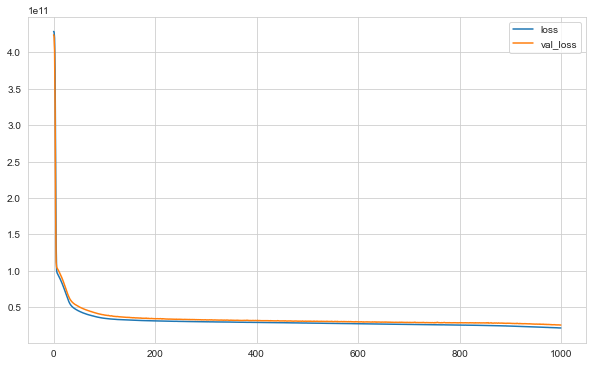

In [73]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [74]:
model.evaluate(X_test, y_test, verbose=0)

19481683968.0

In [75]:
y_pred = model.predict(X_test)

In [76]:
eval_metric(y_test, y_pred)

r2_score: 0.8483676972225389 
mae: 84168.78107638888 
mse: 19481682162.829323 
rmse: 139576.7966491183


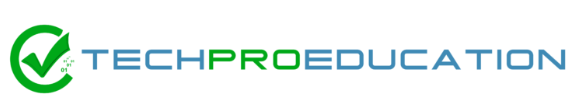

### learning_rate

In [77]:
from tensorflow.keras.optimizers import Adam

In [78]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003) # default learning rate value is 0.001 
model.compile(optimizer = opt, loss = 'mse')

#optimizer bu sekilde bir degiskene atanarak yazilabilir
#adam icine learnin rate degerini veriyoruz,
#hem adam veriyoruz, hemde learning ratede veriyoruz

In [79]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000)

Epoch 1/1000
130/130 [==============================] - 1s 3ms/step - loss: 428062801920.0000 - val_loss: 419663216640.0000
Epoch 2/1000
130/130 [==============================] - 0s 2ms/step - loss: 348343828480.0000 - val_loss: 181425520640.0000
Epoch 3/1000
130/130 [==============================] - 0s 2ms/step - loss: 108675301376.0000 - val_loss: 103254376448.0000
Epoch 4/1000
130/130 [==============================] - 0s 2ms/step - loss: 93860659200.0000 - val_loss: 99181690880.0000
Epoch 5/1000
130/130 [==============================] - 0s 2ms/step - loss: 89556869120.0000 - val_loss: 94929666048.0000
Epoch 6/1000
130/130 [==============================] - 0s 2ms/step - loss: 84964999168.0000 - val_loss: 90089545728.0000
Epoch 7/1000
130/130 [==============================] - 0s 2ms/step - loss: 80082558976.0000 - val_loss: 85358977024.0000
Epoch 8/1000
130/130 [==============================] - 0s 2ms/step - loss: 74900635648.0000 - val_loss: 79852060672.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 3ms/step - loss: 31371982848.0000 - val_loss: 34186192896.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 31209103360.0000 - val_loss: 34342035456.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 31234469888.0000 - val_loss: 34200774656.0000
Epoch 70/1000
130/130 [==============================] - 0s 3ms/step - loss: 31153293312.0000 - val_loss: 33958451200.0000
Epoch 71/1000
130/130 [==============================] - 0s 3ms/step - loss: 31257907200.0000 - val_loss: 34409582592.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 31049289728.0000 - val_loss: 33772400640.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 31005421568.0000 - val_loss: 33798410240.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 30962978816.0000 - val_loss: 33820160000.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 2ms/step - loss: 29297629184.0000 - val_loss: 31613927424.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 29317924864.0000 - val_loss: 31554801664.0000
Epoch 135/1000
130/130 [==============================] - 0s 2ms/step - loss: 29221621760.0000 - val_loss: 31497814016.0000
Epoch 136/1000
130/130 [==============================] - 0s 2ms/step - loss: 29163606016.0000 - val_loss: 31370024960.0000
Epoch 137/1000
130/130 [==============================] - 0s 2ms/step - loss: 29143764992.0000 - val_loss: 31421466624.0000
Epoch 138/1000
130/130 [==============================] - 0s 2ms/step - loss: 29076652032.0000 - val_loss: 31921477632.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 29150834688.0000 - val_loss: 31492917248.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 29041117184.0000 - val_loss: 31505125376.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 27805390848.0000 - val_loss: 30200516608.0000
Epoch 200/1000
130/130 [==============================] - 0s 2ms/step - loss: 27736381440.0000 - val_loss: 30028558336.0000
Epoch 201/1000
130/130 [==============================] - 0s 2ms/step - loss: 27714846720.0000 - val_loss: 30725445632.0000
Epoch 202/1000
130/130 [==============================] - 0s 2ms/step - loss: 27643037696.0000 - val_loss: 30586472448.0000
Epoch 203/1000
130/130 [==============================] - 0s 3ms/step - loss: 27593891840.0000 - val_loss: 29958205440.0000
Epoch 204/1000
130/130 [==============================] - 0s 2ms/step - loss: 27563364352.0000 - val_loss: 30470885376.0000
Epoch 205/1000
130/130 [==============================] - 0s 2ms/step - loss: 27588050944.0000 - val_loss: 30094784512.0000
Epoch 206/1000
130/130 [==============================] - 0s 2ms/step - loss: 27536105472.0000 - val_loss: 30171092992.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26041178112.0000 - val_loss: 29054648320.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 26009679872.0000 - val_loss: 28915070976.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 26043766784.0000 - val_loss: 28832456704.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 25986410496.0000 - val_loss: 28704884736.0000
Epoch 269/1000
130/130 [==============================] - 0s 2ms/step - loss: 25924259840.0000 - val_loss: 29378271232.0000
Epoch 270/1000
130/130 [==============================] - 0s 2ms/step - loss: 26008449024.0000 - val_loss: 28995131392.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 25898881024.0000 - val_loss: 28722708480.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 25977362432.0000 - val_loss: 29023864832.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25102673920.0000 - val_loss: 28807530496.0000
Epoch 332/1000
130/130 [==============================] - 0s 2ms/step - loss: 25053190144.0000 - val_loss: 28367173632.0000
Epoch 333/1000
130/130 [==============================] - 0s 2ms/step - loss: 24991959040.0000 - val_loss: 28673775616.0000
Epoch 334/1000
130/130 [==============================] - 0s 2ms/step - loss: 25021433856.0000 - val_loss: 28825929728.0000
Epoch 335/1000
130/130 [==============================] - 0s 2ms/step - loss: 24975968256.0000 - val_loss: 28830758912.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 24968267776.0000 - val_loss: 28243191808.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 24993538048.0000 - val_loss: 28651405312.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 24940081152.0000 - val_loss: 28612683776.0000
Epoch 339/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24388894720.0000 - val_loss: 29753892864.0000
Epoch 398/1000
130/130 [==============================] - 0s 2ms/step - loss: 24437792768.0000 - val_loss: 29058265088.0000
Epoch 399/1000
130/130 [==============================] - 0s 2ms/step - loss: 24414349312.0000 - val_loss: 30056923136.0000
Epoch 400/1000
130/130 [==============================] - 0s 2ms/step - loss: 24515102720.0000 - val_loss: 29195606016.0000
Epoch 401/1000
130/130 [==============================] - 0s 2ms/step - loss: 24438151168.0000 - val_loss: 29019025408.0000
Epoch 402/1000
130/130 [==============================] - 0s 2ms/step - loss: 24432752640.0000 - val_loss: 29106982912.0000
Epoch 403/1000
130/130 [==============================] - 0s 2ms/step - loss: 24340725760.0000 - val_loss: 29762473984.0000
Epoch 404/1000
130/130 [==============================] - 0s 2ms/step - loss: 24431415296.0000 - val_loss: 28960944128.0000
Epoch 405/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 24000219136.0000 - val_loss: 29487269888.0000
Epoch 464/1000
130/130 [==============================] - 0s 2ms/step - loss: 23914928128.0000 - val_loss: 29665912832.0000
Epoch 465/1000
130/130 [==============================] - 0s 3ms/step - loss: 23909191680.0000 - val_loss: 29880121344.0000
Epoch 466/1000
130/130 [==============================] - 0s 2ms/step - loss: 23962310656.0000 - val_loss: 29609039872.0000
Epoch 467/1000
130/130 [==============================] - 0s 2ms/step - loss: 23950987264.0000 - val_loss: 29614254080.0000
Epoch 468/1000
130/130 [==============================] - 0s 2ms/step - loss: 23885953024.0000 - val_loss: 29878552576.0000
Epoch 469/1000
130/130 [==============================] - 0s 2ms/step - loss: 23942529024.0000 - val_loss: 29697255424.0000
Epoch 470/1000
130/130 [==============================] - 0s 2ms/step - loss: 23885117440.0000 - val_loss: 29792333824.0000
Epoch 471/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 23498569728.0000 - val_loss: 30310860800.0000
Epoch 530/1000
130/130 [==============================] - 0s 2ms/step - loss: 23484352512.0000 - val_loss: 30513094656.0000
Epoch 531/1000
130/130 [==============================] - 0s 2ms/step - loss: 23446708224.0000 - val_loss: 30285486080.0000
Epoch 532/1000
130/130 [==============================] - 0s 2ms/step - loss: 23439288320.0000 - val_loss: 30620485632.0000
Epoch 533/1000
130/130 [==============================] - 0s 2ms/step - loss: 23453491200.0000 - val_loss: 30193805312.0000
Epoch 534/1000
130/130 [==============================] - 0s 2ms/step - loss: 23427213312.0000 - val_loss: 30357524480.0000
Epoch 535/1000
130/130 [==============================] - 0s 2ms/step - loss: 23453265920.0000 - val_loss: 30442713088.0000
Epoch 536/1000
130/130 [==============================] - 0s 2ms/step - loss: 23489718272.0000 - val_loss: 30350460928.0000
Epoch 537/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 23145115648.0000 - val_loss: 30406678528.0000
Epoch 596/1000
130/130 [==============================] - 0s 3ms/step - loss: 23084156928.0000 - val_loss: 31824990208.0000
Epoch 597/1000
130/130 [==============================] - 0s 3ms/step - loss: 23188549632.0000 - val_loss: 31080212480.0000
Epoch 598/1000
130/130 [==============================] - 0s 3ms/step - loss: 23211763712.0000 - val_loss: 30812674048.0000
Epoch 599/1000
130/130 [==============================] - 0s 3ms/step - loss: 23077257216.0000 - val_loss: 30895216640.0000
Epoch 600/1000
130/130 [==============================] - 0s 3ms/step - loss: 23082838016.0000 - val_loss: 30612338688.0000
Epoch 601/1000
130/130 [==============================] - 0s 3ms/step - loss: 23111899136.0000 - val_loss: 30491154432.0000
Epoch 602/1000
130/130 [==============================] - 0s 2ms/step - loss: 23083554816.0000 - val_loss: 30726496256.0000
Epoch 603/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 21938819072.0000 - val_loss: 30378846208.0000
Epoch 662/1000
130/130 [==============================] - 0s 2ms/step - loss: 21940131840.0000 - val_loss: 29743616000.0000
Epoch 663/1000
130/130 [==============================] - 0s 2ms/step - loss: 21745203200.0000 - val_loss: 29651142656.0000
Epoch 664/1000
130/130 [==============================] - 0s 2ms/step - loss: 21657661440.0000 - val_loss: 29380913152.0000
Epoch 665/1000
130/130 [==============================] - 0s 2ms/step - loss: 21688825856.0000 - val_loss: 30117023744.0000
Epoch 666/1000
130/130 [==============================] - 0s 2ms/step - loss: 21571901440.0000 - val_loss: 29876146176.0000
Epoch 667/1000
130/130 [==============================] - 0s 2ms/step - loss: 21426919424.0000 - val_loss: 29169528832.0000
Epoch 668/1000
130/130 [==============================] - 0s 2ms/step - loss: 21287577600.0000 - val_loss: 29225318400.0000
Epoch 669/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 17517072384.0000 - val_loss: 25794023424.0000
Epoch 728/1000
130/130 [==============================] - 0s 2ms/step - loss: 17567766528.0000 - val_loss: 26443528192.0000
Epoch 729/1000
130/130 [==============================] - 0s 2ms/step - loss: 17387311104.0000 - val_loss: 27285497856.0000
Epoch 730/1000
130/130 [==============================] - 0s 2ms/step - loss: 17368741888.0000 - val_loss: 26293274624.0000
Epoch 731/1000
130/130 [==============================] - 0s 2ms/step - loss: 17421717504.0000 - val_loss: 26025555968.0000
Epoch 732/1000
130/130 [==============================] - 0s 2ms/step - loss: 17373921280.0000 - val_loss: 25538805760.0000
Epoch 733/1000
130/130 [==============================] - 0s 2ms/step - loss: 17363329024.0000 - val_loss: 26114279424.0000
Epoch 734/1000
130/130 [==============================] - 0s 2ms/step - loss: 17294561280.0000 - val_loss: 25578508288.0000
Epoch 735/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 16319653888.0000 - val_loss: 25966344192.0000
Epoch 794/1000
130/130 [==============================] - 0s 2ms/step - loss: 16270789632.0000 - val_loss: 25739741184.0000
Epoch 795/1000
130/130 [==============================] - 0s 2ms/step - loss: 16272185344.0000 - val_loss: 25950244864.0000
Epoch 796/1000
130/130 [==============================] - 0s 2ms/step - loss: 16206869504.0000 - val_loss: 25623406592.0000
Epoch 797/1000
130/130 [==============================] - 0s 2ms/step - loss: 16238014464.0000 - val_loss: 25647542272.0000
Epoch 798/1000
130/130 [==============================] - 0s 2ms/step - loss: 16309553152.0000 - val_loss: 26009710592.0000
Epoch 799/1000
130/130 [==============================] - 0s 3ms/step - loss: 16199504896.0000 - val_loss: 25524527104.0000
Epoch 800/1000
130/130 [==============================] - 0s 2ms/step - loss: 16157900800.0000 - val_loss: 25668843520.0000
Epoch 801/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 15367771136.0000 - val_loss: 24706547712.0000
Epoch 860/1000
130/130 [==============================] - 0s 2ms/step - loss: 15434488832.0000 - val_loss: 24979609600.0000
Epoch 861/1000
130/130 [==============================] - 0s 2ms/step - loss: 15323367424.0000 - val_loss: 25035644928.0000
Epoch 862/1000
130/130 [==============================] - 0s 2ms/step - loss: 15263689728.0000 - val_loss: 26288764928.0000
Epoch 863/1000
130/130 [==============================] - 0s 2ms/step - loss: 15414706176.0000 - val_loss: 25586542592.0000
Epoch 864/1000
130/130 [==============================] - 0s 2ms/step - loss: 15305089024.0000 - val_loss: 25135063040.0000
Epoch 865/1000
130/130 [==============================] - 0s 2ms/step - loss: 15275672576.0000 - val_loss: 24985434112.0000
Epoch 866/1000
130/130 [==============================] - 0s 2ms/step - loss: 15150201856.0000 - val_loss: 25019420672.0000
Epoch 867/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 14322227200.0000 - val_loss: 24036911104.0000
Epoch 926/1000
130/130 [==============================] - 0s 2ms/step - loss: 14325151744.0000 - val_loss: 24251265024.0000
Epoch 927/1000
130/130 [==============================] - 0s 2ms/step - loss: 14347532288.0000 - val_loss: 24392204288.0000
Epoch 928/1000
130/130 [==============================] - 0s 2ms/step - loss: 14257582080.0000 - val_loss: 24743790592.0000
Epoch 929/1000
130/130 [==============================] - 0s 2ms/step - loss: 14265586688.0000 - val_loss: 24155088896.0000
Epoch 930/1000
130/130 [==============================] - 0s 2ms/step - loss: 14293917696.0000 - val_loss: 24719968256.0000
Epoch 931/1000
130/130 [==============================] - 0s 2ms/step - loss: 14219940864.0000 - val_loss: 24169558016.0000
Epoch 932/1000
130/130 [==============================] - 0s 2ms/step - loss: 14236114944.0000 - val_loss: 24221237248.0000
Epoch 933/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 13485794304.0000 - val_loss: 23676934144.0000
Epoch 992/1000
130/130 [==============================] - 0s 2ms/step - loss: 13370129408.0000 - val_loss: 23615612928.0000
Epoch 993/1000
130/130 [==============================] - 0s 2ms/step - loss: 13595196416.0000 - val_loss: 23574050816.0000
Epoch 994/1000
130/130 [==============================] - 0s 2ms/step - loss: 13301984256.0000 - val_loss: 24025067520.0000
Epoch 995/1000
130/130 [==============================] - 0s 3ms/step - loss: 13323107328.0000 - val_loss: 23652409344.0000
Epoch 996/1000
130/130 [==============================] - 0s 3ms/step - loss: 13270652928.0000 - val_loss: 23347337216.0000
Epoch 997/1000
130/130 [==============================] - 0s 2ms/step - loss: 13242925056.0000 - val_loss: 23294156800.0000
Epoch 998/1000
130/130 [==============================] - 0s 3ms/step - loss: 13344082944.0000 - val_loss: 23795546112.0000
Epoch 999/1000
130/130 

<AxesSubplot:>

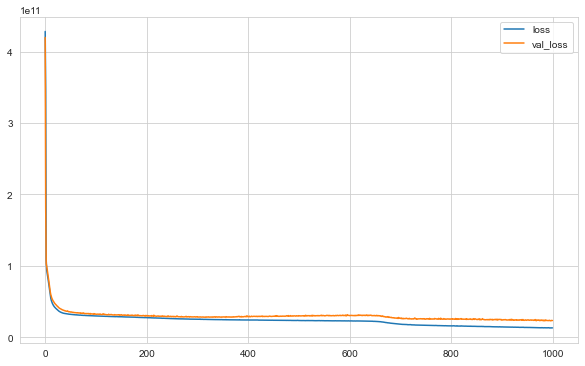

In [80]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

#burda biryerden sonrasi ayni olmus,bu sekilde overfittinge gidiyor
# bu cizgilerin birbirlerinden ayrilmasi bozulma sinyalleri, bunlarin birbirine uyumlu olmasi gerekir
#uyumsuzlasma noktasini tespit etmek gerekiyor
#y ekseni hata oranlarini gösteriyor

In [81]:
y_pred = model.predict(X_test)

In [82]:
eval_metric(y_test, y_pred)

#bu degerlerin ne kadar kücük olmasi bizim icin iyi olur
#rmse 'ye göre modelimiz 128 bin hatayla evin fiyatini tahmin ediyor

#learningrate degistirerek 0.82 den 0.87 cikti.
# learning rate kendini güncellemiyor dedi hoca, ama biraz arastirmamiz lazim

r2_score: 0.8705778422629774 
mae: 76087.20091869214 
mse: 16628128015.444315 
rmse: 128950.0989353801


### EarlyStopping

In [83]:
from tensorflow.keras.callbacks import EarlyStopping

In [84]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)  #learning rate 0.003 olarak sabit alinsin diyorum
model.compile(optimizer = opt, loss = 'mse')

In [85]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

# patience sabir demek ingilizce de ,25 epoch boyunca  loss degeri degismiyorsa  onu kes
# mode = auto secince basari oraninin düsmesini ele aliyor

In [86]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 2s 5ms/step - loss: 428062801920.0000 - val_loss: 419663216640.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 348343828480.0000 - val_loss: 181425520640.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 108675301376.0000 - val_loss: 103254376448.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 93860659200.0000 - val_loss: 99181690880.0000
Epoch 5/1000
130/130 [==============================] - 0s 4ms/step - loss: 89556869120.0000 - val_loss: 94929666048.0000
Epoch 6/1000
130/130 [==============================] - 0s 4ms/step - loss: 84964999168.0000 - val_loss: 90089545728.0000
Epoch 7/1000
130/130 [==============================] - 1s 4ms/step - loss: 80082558976.0000 - val_loss: 85358977024.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 74900635648.0000 - val_loss: 79852060672.0000
Epoch 9/1000
130/1

130/130 [==============================] - 0s 3ms/step - loss: 31371982848.0000 - val_loss: 34186192896.0000
Epoch 68/1000
130/130 [==============================] - 0s 2ms/step - loss: 31209103360.0000 - val_loss: 34342035456.0000
Epoch 69/1000
130/130 [==============================] - 0s 2ms/step - loss: 31234469888.0000 - val_loss: 34200774656.0000
Epoch 70/1000
130/130 [==============================] - 0s 3ms/step - loss: 31153293312.0000 - val_loss: 33958451200.0000
Epoch 71/1000
130/130 [==============================] - 0s 3ms/step - loss: 31257907200.0000 - val_loss: 34409582592.0000
Epoch 72/1000
130/130 [==============================] - 0s 2ms/step - loss: 31049289728.0000 - val_loss: 33772400640.0000
Epoch 73/1000
130/130 [==============================] - 0s 2ms/step - loss: 31005421568.0000 - val_loss: 33798410240.0000
Epoch 74/1000
130/130 [==============================] - 0s 2ms/step - loss: 30962978816.0000 - val_loss: 33820160000.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 3ms/step - loss: 29297629184.0000 - val_loss: 31613927424.0000
Epoch 134/1000
130/130 [==============================] - 0s 2ms/step - loss: 29317924864.0000 - val_loss: 31554801664.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 29221621760.0000 - val_loss: 31497814016.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 29163606016.0000 - val_loss: 31370024960.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 29143764992.0000 - val_loss: 31421466624.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 29076652032.0000 - val_loss: 31921477632.0000
Epoch 139/1000
130/130 [==============================] - 0s 2ms/step - loss: 29150834688.0000 - val_loss: 31492917248.0000
Epoch 140/1000
130/130 [==============================] - 0s 2ms/step - loss: 29041117184.0000 - val_loss: 31505125376.0000
Epoch 141/1000
130/130 

130/130 [==============================] - 0s 3ms/step - loss: 27805390848.0000 - val_loss: 30200516608.0000
Epoch 200/1000
130/130 [==============================] - 1s 5ms/step - loss: 27736381440.0000 - val_loss: 30028558336.0000
Epoch 201/1000
130/130 [==============================] - 0s 3ms/step - loss: 27714846720.0000 - val_loss: 30725445632.0000
Epoch 202/1000
130/130 [==============================] - 1s 5ms/step - loss: 27643037696.0000 - val_loss: 30586472448.0000
Epoch 203/1000
130/130 [==============================] - 0s 3ms/step - loss: 27593891840.0000 - val_loss: 29958205440.0000
Epoch 204/1000
130/130 [==============================] - 0s 3ms/step - loss: 27563364352.0000 - val_loss: 30470885376.0000
Epoch 205/1000
130/130 [==============================] - 1s 5ms/step - loss: 27588050944.0000 - val_loss: 30094784512.0000
Epoch 206/1000
130/130 [==============================] - 1s 4ms/step - loss: 27536105472.0000 - val_loss: 30171092992.0000
Epoch 207/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 26041178112.0000 - val_loss: 29054648320.0000
Epoch 266/1000
130/130 [==============================] - 0s 2ms/step - loss: 26009679872.0000 - val_loss: 28915070976.0000
Epoch 267/1000
130/130 [==============================] - 0s 2ms/step - loss: 26043766784.0000 - val_loss: 28832456704.0000
Epoch 268/1000
130/130 [==============================] - 0s 2ms/step - loss: 25986410496.0000 - val_loss: 28704884736.0000
Epoch 269/1000
130/130 [==============================] - 0s 3ms/step - loss: 25924259840.0000 - val_loss: 29378271232.0000
Epoch 270/1000
130/130 [==============================] - 0s 3ms/step - loss: 26008449024.0000 - val_loss: 28995131392.0000
Epoch 271/1000
130/130 [==============================] - 0s 2ms/step - loss: 25898881024.0000 - val_loss: 28722708480.0000
Epoch 272/1000
130/130 [==============================] - 0s 2ms/step - loss: 25977362432.0000 - val_loss: 29023864832.0000
Epoch 273/1000
130/130 

130/130 [==============================] - 0s 2ms/step - loss: 25102673920.0000 - val_loss: 28807530496.0000
Epoch 332/1000
130/130 [==============================] - 0s 3ms/step - loss: 25053190144.0000 - val_loss: 28367173632.0000
Epoch 333/1000
130/130 [==============================] - 0s 3ms/step - loss: 24991959040.0000 - val_loss: 28673775616.0000
Epoch 334/1000
130/130 [==============================] - 0s 2ms/step - loss: 25021433856.0000 - val_loss: 28825929728.0000
Epoch 335/1000
130/130 [==============================] - 0s 2ms/step - loss: 24975968256.0000 - val_loss: 28830758912.0000
Epoch 336/1000
130/130 [==============================] - 0s 2ms/step - loss: 24968267776.0000 - val_loss: 28243191808.0000
Epoch 337/1000
130/130 [==============================] - 0s 2ms/step - loss: 24993538048.0000 - val_loss: 28651405312.0000
Epoch 338/1000
130/130 [==============================] - 0s 2ms/step - loss: 24940081152.0000 - val_loss: 28612683776.0000
Epoch 339/1000
130/130 

<AxesSubplot:>

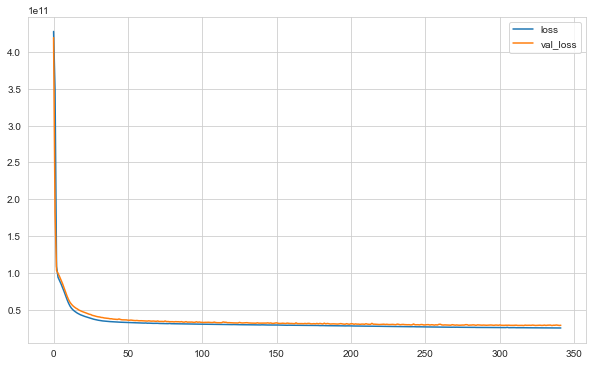

In [87]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

#aslinda asagilarda ayrismanin baslayacagi yerde 342 civari

#milyonluk datalarda , bazen bir yerden sonra ayrisiyor sonra kendi hatasini anlayip, kendi hatasini düzeltmeye baslayabilir
#milyon datalarda early stopping yapilmasi tavsiye edilmez

In [88]:
y_pred = model.predict(X_test)

In [89]:
eval_metric(y_test, y_pred)

#normalde seed= ayni secilmisti cevaplarinda ayni olmasi gerkiyordu ama herkeste farkli cikiyor,
# hoca farkli sürümlerde farkli random_size = degerleri aliyor

r2_score: 0.8214853487996385 
mae: 94599.1376916956 
mse: 22935519888.514954 
rmse: 151444.7750452783


### Dropout

The Dropout layer randomly sets input units to 0 with a frequency of `rate`
at each step during training time, which helps prevent overfitting.

In [90]:
from tensorflow.keras.layers import Dropout

#katmanlarin 0.20 si calisack anlamina geliyor,
# 20 nörondan her %20 si yani 4 tane aliyor, her batch icin farkli 4 taneyi aliyor,
# istedigin hidden layerlara koymak zorunda degilsin.
# 

In [91]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(29, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(15, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(8, activation = 'relu'))
model.add(Dropout(0.2))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

In [92]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [93]:
model.fit(x = X_train, y = y_train, validation_split = 0.15, batch_size = 128, epochs = 1000, callbacks = [early_stop])

Epoch 1/1000
130/130 [==============================] - 1s 4ms/step - loss: 427572002816.0000 - val_loss: 414624251904.0000
Epoch 2/1000
130/130 [==============================] - 0s 3ms/step - loss: 272045604864.0000 - val_loss: 106626056192.0000
Epoch 3/1000
130/130 [==============================] - 0s 3ms/step - loss: 127681044480.0000 - val_loss: 101564833792.0000
Epoch 4/1000
130/130 [==============================] - 0s 3ms/step - loss: 115980648448.0000 - val_loss: 94682439680.0000
Epoch 5/1000
130/130 [==============================] - 0s 3ms/step - loss: 111958171648.0000 - val_loss: 88348639232.0000
Epoch 6/1000
130/130 [==============================] - 0s 3ms/step - loss: 105106890752.0000 - val_loss: 82633883648.0000
Epoch 7/1000
130/130 [==============================] - 0s 3ms/step - loss: 98024972288.0000 - val_loss: 74033315840.0000
Epoch 8/1000
130/130 [==============================] - 0s 3ms/step - loss: 89550897152.0000 - val_loss: 67734417408.0000
Epoch 9/1000
13

130/130 [==============================] - 0s 3ms/step - loss: 61701799936.0000 - val_loss: 36963651584.0000
Epoch 68/1000
130/130 [==============================] - 0s 3ms/step - loss: 60822773760.0000 - val_loss: 36193939456.0000
Epoch 69/1000
130/130 [==============================] - 0s 3ms/step - loss: 61968359424.0000 - val_loss: 35607891968.0000
Epoch 70/1000
130/130 [==============================] - 0s 4ms/step - loss: 63638933504.0000 - val_loss: 35890655232.0000
Epoch 71/1000
130/130 [==============================] - 0s 4ms/step - loss: 62670032896.0000 - val_loss: 35152445440.0000
Epoch 72/1000
130/130 [==============================] - 0s 4ms/step - loss: 60197240832.0000 - val_loss: 36408389632.0000
Epoch 73/1000
130/130 [==============================] - 0s 3ms/step - loss: 61431975936.0000 - val_loss: 35616440320.0000
Epoch 74/1000
130/130 [==============================] - 0s 3ms/step - loss: 61985665024.0000 - val_loss: 36327239680.0000
Epoch 75/1000
130/130 [=======

130/130 [==============================] - 0s 3ms/step - loss: 58470293504.0000 - val_loss: 33604259840.0000
Epoch 134/1000
130/130 [==============================] - 0s 3ms/step - loss: 58757156864.0000 - val_loss: 33564682240.0000
Epoch 135/1000
130/130 [==============================] - 0s 3ms/step - loss: 59121311744.0000 - val_loss: 33453811712.0000
Epoch 136/1000
130/130 [==============================] - 0s 3ms/step - loss: 62195097600.0000 - val_loss: 33983637504.0000
Epoch 137/1000
130/130 [==============================] - 0s 3ms/step - loss: 57074524160.0000 - val_loss: 33290502144.0000
Epoch 138/1000
130/130 [==============================] - 0s 3ms/step - loss: 58397921280.0000 - val_loss: 32809998336.0000
Epoch 139/1000
130/130 [==============================] - 0s 3ms/step - loss: 57368068096.0000 - val_loss: 32952647680.0000
Epoch 140/1000
130/130 [==============================] - 0s 3ms/step - loss: 59449552896.0000 - val_loss: 34597261312.0000
Epoch 141/1000
130/130 

<AxesSubplot:>

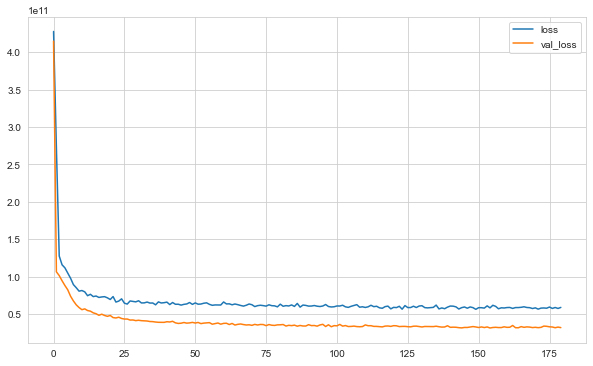

In [94]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

#burda overfitting olmus, yani cizgiler ayrismis,


In [95]:
y_pred = model.predict(X_test)

In [96]:
eval_metric(y_test, y_pred)

#dropout ile scoreumuz düsmüs oldu,buda overfitting olmus, data da az oldugundan dolayi
#büyük datalarda dropout yapmak daha mantikli

r2_score: 0.7904574984169389 
mae: 101831.87335069444 
mse: 26921970719.105556 
rmse: 164079.15991711305


## Saving Final Model and Scaler

In [97]:
import pickle
pickle.dump(scaler, open("scaler_kc_house", 'wb'))

In [98]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(29, activation = 'relu'))
model.add(Dense(29, activation = 'relu'))
model.add(Dense(15, activation = 'relu'))
model.add(Dense(8, activation = 'relu'))
model.add(Dense(1))

opt = Adam(lr = 0.003)
model.compile(optimizer = opt, loss = 'mse')

#burda üstte basarili oldugumuz parametreler ile devam edecegiz.
#mesela burda dropout 

In [99]:
#early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 25)

In [100]:
model.fit(x = X_train, y = y_train, validation_data = (X_test, y_test), batch_size = 128, epochs = 1000,
         # callbacks = [early_stop]
         )

Epoch 1/1000
152/152 [==============================] - 1s 3ms/step - loss: 426416144384.0000 - val_loss: 406002565120.0000
Epoch 2/1000
152/152 [==============================] - 0s 2ms/step - loss: 274798018560.0000 - val_loss: 94608293888.0000
Epoch 3/1000
152/152 [==============================] - 0s 2ms/step - loss: 97477058560.0000 - val_loss: 88555741184.0000
Epoch 4/1000
152/152 [==============================] - 0s 2ms/step - loss: 92657041408.0000 - val_loss: 83812974592.0000
Epoch 5/1000
152/152 [==============================] - 0s 3ms/step - loss: 87678459904.0000 - val_loss: 78632173568.0000
Epoch 6/1000
152/152 [==============================] - 0s 2ms/step - loss: 82362630144.0000 - val_loss: 73219350528.0000
Epoch 7/1000
152/152 [==============================] - 0s 3ms/step - loss: 76469280768.0000 - val_loss: 67131924480.0000
Epoch 8/1000
152/152 [==============================] - 0s 2ms/step - loss: 70028427264.0000 - val_loss: 60857552896.0000
Epoch 9/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 31058569216.0000 - val_loss: 27184390144.0000
Epoch 68/1000
152/152 [==============================] - 0s 3ms/step - loss: 31037728768.0000 - val_loss: 27142287360.0000
Epoch 69/1000
152/152 [==============================] - 0s 2ms/step - loss: 30925281280.0000 - val_loss: 27142291456.0000
Epoch 70/1000
152/152 [==============================] - 0s 2ms/step - loss: 30860781568.0000 - val_loss: 27048972288.0000
Epoch 71/1000
152/152 [==============================] - 0s 2ms/step - loss: 30907084800.0000 - val_loss: 26939435008.0000
Epoch 72/1000
152/152 [==============================] - 0s 2ms/step - loss: 30770432000.0000 - val_loss: 27012235264.0000
Epoch 73/1000
152/152 [==============================] - 0s 2ms/step - loss: 30838374400.0000 - val_loss: 27038339072.0000
Epoch 74/1000
152/152 [==============================] - 0s 2ms/step - loss: 30804940800.0000 - val_loss: 26871232512.0000
Epoch 75/1000
152/152 [=======

152/152 [==============================] - 0s 3ms/step - loss: 28927721472.0000 - val_loss: 24912111616.0000
Epoch 134/1000
152/152 [==============================] - 0s 2ms/step - loss: 28812468224.0000 - val_loss: 24947718144.0000
Epoch 135/1000
152/152 [==============================] - 0s 2ms/step - loss: 28880648192.0000 - val_loss: 24947027968.0000
Epoch 136/1000
152/152 [==============================] - 0s 2ms/step - loss: 28749557760.0000 - val_loss: 25097678848.0000
Epoch 137/1000
152/152 [==============================] - 0s 3ms/step - loss: 28864739328.0000 - val_loss: 24888606720.0000
Epoch 138/1000
152/152 [==============================] - 0s 3ms/step - loss: 28752973824.0000 - val_loss: 24842823680.0000
Epoch 139/1000
152/152 [==============================] - 1s 4ms/step - loss: 28675082240.0000 - val_loss: 24737318912.0000
Epoch 140/1000
152/152 [==============================] - 0s 2ms/step - loss: 28714737664.0000 - val_loss: 24678279168.0000
Epoch 141/1000
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 27143088128.0000 - val_loss: 23743064064.0000
Epoch 200/1000
152/152 [==============================] - 0s 2ms/step - loss: 27134087168.0000 - val_loss: 23707453440.0000
Epoch 201/1000
152/152 [==============================] - 0s 2ms/step - loss: 27142049792.0000 - val_loss: 23550543872.0000
Epoch 202/1000
152/152 [==============================] - 0s 2ms/step - loss: 27101040640.0000 - val_loss: 23501961216.0000
Epoch 203/1000
152/152 [==============================] - 0s 3ms/step - loss: 27065321472.0000 - val_loss: 23610574848.0000
Epoch 204/1000
152/152 [==============================] - 0s 3ms/step - loss: 26995814400.0000 - val_loss: 23663568896.0000
Epoch 205/1000
152/152 [==============================] - 0s 3ms/step - loss: 26994999296.0000 - val_loss: 23610425344.0000
Epoch 206/1000
152/152 [==============================] - 0s 3ms/step - loss: 26988939264.0000 - val_loss: 23498995712.0000
Epoch 207/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 25881380864.0000 - val_loss: 22889529344.0000
Epoch 266/1000
152/152 [==============================] - 0s 2ms/step - loss: 25894111232.0000 - val_loss: 23064004608.0000
Epoch 267/1000
152/152 [==============================] - 0s 2ms/step - loss: 25931126784.0000 - val_loss: 22950772736.0000
Epoch 268/1000
152/152 [==============================] - 0s 3ms/step - loss: 25932765184.0000 - val_loss: 22942750720.0000
Epoch 269/1000
152/152 [==============================] - 0s 3ms/step - loss: 25958578176.0000 - val_loss: 22895339520.0000
Epoch 270/1000
152/152 [==============================] - 0s 3ms/step - loss: 25852147712.0000 - val_loss: 22949769216.0000
Epoch 271/1000
152/152 [==============================] - 0s 3ms/step - loss: 25899788288.0000 - val_loss: 22958223360.0000
Epoch 272/1000
152/152 [==============================] - 0s 3ms/step - loss: 25799514112.0000 - val_loss: 23546130432.0000
Epoch 273/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 25117831168.0000 - val_loss: 22661900288.0000
Epoch 332/1000
152/152 [==============================] - 0s 3ms/step - loss: 25249390592.0000 - val_loss: 22892027904.0000
Epoch 333/1000
152/152 [==============================] - 0s 2ms/step - loss: 25131282432.0000 - val_loss: 22666469376.0000
Epoch 334/1000
152/152 [==============================] - 0s 2ms/step - loss: 25174333440.0000 - val_loss: 22708340736.0000
Epoch 335/1000
152/152 [==============================] - 1s 4ms/step - loss: 25214478336.0000 - val_loss: 22762612736.0000
Epoch 336/1000
152/152 [==============================] - 0s 3ms/step - loss: 25096804352.0000 - val_loss: 22732257280.0000
Epoch 337/1000
152/152 [==============================] - 0s 3ms/step - loss: 25177470976.0000 - val_loss: 22617294848.0000
Epoch 338/1000
152/152 [==============================] - 1s 3ms/step - loss: 25096925184.0000 - val_loss: 22757607424.0000
Epoch 339/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 24803002368.0000 - val_loss: 22638589952.0000
Epoch 398/1000
152/152 [==============================] - 0s 2ms/step - loss: 24736591872.0000 - val_loss: 22636865536.0000
Epoch 399/1000
152/152 [==============================] - 0s 2ms/step - loss: 24761229312.0000 - val_loss: 22507270144.0000
Epoch 400/1000
152/152 [==============================] - 0s 2ms/step - loss: 24704731136.0000 - val_loss: 22592618496.0000
Epoch 401/1000
152/152 [==============================] - 0s 2ms/step - loss: 24687296512.0000 - val_loss: 22622169088.0000
Epoch 402/1000
152/152 [==============================] - 0s 2ms/step - loss: 24755511296.0000 - val_loss: 22798473216.0000
Epoch 403/1000
152/152 [==============================] - 0s 2ms/step - loss: 24722432000.0000 - val_loss: 22602072064.0000
Epoch 404/1000
152/152 [==============================] - 0s 2ms/step - loss: 24665374720.0000 - val_loss: 22556856320.0000
Epoch 405/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 24401291264.0000 - val_loss: 22485243904.0000
Epoch 464/1000
152/152 [==============================] - 0s 2ms/step - loss: 24508985344.0000 - val_loss: 22358218752.0000
Epoch 465/1000
152/152 [==============================] - 0s 2ms/step - loss: 24435755008.0000 - val_loss: 22407286784.0000
Epoch 466/1000
152/152 [==============================] - 0s 2ms/step - loss: 24386777088.0000 - val_loss: 22364311552.0000
Epoch 467/1000
152/152 [==============================] - 0s 2ms/step - loss: 24383688704.0000 - val_loss: 22371993600.0000
Epoch 468/1000
152/152 [==============================] - 0s 2ms/step - loss: 24391960576.0000 - val_loss: 22389035008.0000
Epoch 469/1000
152/152 [==============================] - 0s 2ms/step - loss: 24460572672.0000 - val_loss: 22396375040.0000
Epoch 470/1000
152/152 [==============================] - 0s 2ms/step - loss: 24384116736.0000 - val_loss: 22443350016.0000
Epoch 471/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 24097503232.0000 - val_loss: 22284265472.0000
Epoch 530/1000
152/152 [==============================] - 0s 2ms/step - loss: 24169140224.0000 - val_loss: 22235406336.0000
Epoch 531/1000
152/152 [==============================] - 0s 2ms/step - loss: 24120176640.0000 - val_loss: 22201243648.0000
Epoch 532/1000
152/152 [==============================] - 0s 2ms/step - loss: 24070508544.0000 - val_loss: 22285221888.0000
Epoch 533/1000
152/152 [==============================] - 0s 2ms/step - loss: 24032651264.0000 - val_loss: 22323953664.0000
Epoch 534/1000
152/152 [==============================] - 0s 2ms/step - loss: 24079554560.0000 - val_loss: 22232696832.0000
Epoch 535/1000
152/152 [==============================] - 0s 2ms/step - loss: 24067014656.0000 - val_loss: 22511513600.0000
Epoch 536/1000
152/152 [==============================] - 0s 3ms/step - loss: 24115009536.0000 - val_loss: 22398760960.0000
Epoch 537/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 23399491584.0000 - val_loss: 22098130944.0000
Epoch 596/1000
152/152 [==============================] - 0s 2ms/step - loss: 23454074880.0000 - val_loss: 22119602176.0000
Epoch 597/1000
152/152 [==============================] - 0s 2ms/step - loss: 23408525312.0000 - val_loss: 22030284800.0000
Epoch 598/1000
152/152 [==============================] - 0s 2ms/step - loss: 23473909760.0000 - val_loss: 22162210816.0000
Epoch 599/1000
152/152 [==============================] - 0s 2ms/step - loss: 23411552256.0000 - val_loss: 22054871040.0000
Epoch 600/1000
152/152 [==============================] - 0s 2ms/step - loss: 23380811776.0000 - val_loss: 22151493632.0000
Epoch 601/1000
152/152 [==============================] - 0s 2ms/step - loss: 23351730176.0000 - val_loss: 21929338880.0000
Epoch 602/1000
152/152 [==============================] - 0s 2ms/step - loss: 23297726464.0000 - val_loss: 21989748736.0000
Epoch 603/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 18151282688.0000 - val_loss: 17569398784.0000
Epoch 662/1000
152/152 [==============================] - 0s 2ms/step - loss: 18105331712.0000 - val_loss: 17475987456.0000
Epoch 663/1000
152/152 [==============================] - 0s 2ms/step - loss: 17946591232.0000 - val_loss: 17378062336.0000
Epoch 664/1000
152/152 [==============================] - 0s 2ms/step - loss: 17982081024.0000 - val_loss: 17461608448.0000
Epoch 665/1000
152/152 [==============================] - 0s 2ms/step - loss: 17871214592.0000 - val_loss: 17419008000.0000
Epoch 666/1000
152/152 [==============================] - 0s 2ms/step - loss: 17853212672.0000 - val_loss: 17418463232.0000
Epoch 667/1000
152/152 [==============================] - 0s 2ms/step - loss: 17757962240.0000 - val_loss: 17470248960.0000
Epoch 668/1000
152/152 [==============================] - 0s 2ms/step - loss: 17736382464.0000 - val_loss: 17365356544.0000
Epoch 669/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 15855822848.0000 - val_loss: 16407192576.0000
Epoch 728/1000
152/152 [==============================] - 0s 3ms/step - loss: 15806538752.0000 - val_loss: 16636368896.0000
Epoch 729/1000
152/152 [==============================] - 0s 3ms/step - loss: 15822565376.0000 - val_loss: 16523813888.0000
Epoch 730/1000
152/152 [==============================] - 0s 2ms/step - loss: 15770160128.0000 - val_loss: 16407684096.0000
Epoch 731/1000
152/152 [==============================] - 0s 3ms/step - loss: 15845401600.0000 - val_loss: 16517749760.0000
Epoch 732/1000
152/152 [==============================] - 0s 3ms/step - loss: 15755046912.0000 - val_loss: 16560147456.0000
Epoch 733/1000
152/152 [==============================] - 0s 2ms/step - loss: 15750803456.0000 - val_loss: 16574747648.0000
Epoch 734/1000
152/152 [==============================] - 0s 2ms/step - loss: 15696616448.0000 - val_loss: 16586596352.0000
Epoch 735/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 14572355584.0000 - val_loss: 15432450048.0000
Epoch 794/1000
152/152 [==============================] - 1s 4ms/step - loss: 14535964672.0000 - val_loss: 15360856064.0000
Epoch 795/1000
152/152 [==============================] - 0s 3ms/step - loss: 14509825024.0000 - val_loss: 15368813568.0000
Epoch 796/1000
152/152 [==============================] - 0s 3ms/step - loss: 14582230016.0000 - val_loss: 15433838592.0000
Epoch 797/1000
152/152 [==============================] - 0s 3ms/step - loss: 14569023488.0000 - val_loss: 15391724544.0000
Epoch 798/1000
152/152 [==============================] - 0s 3ms/step - loss: 14545486848.0000 - val_loss: 15571627008.0000
Epoch 799/1000
152/152 [==============================] - 0s 3ms/step - loss: 14505000960.0000 - val_loss: 15320726528.0000
Epoch 800/1000
152/152 [==============================] - 0s 3ms/step - loss: 14381594624.0000 - val_loss: 15118098432.0000
Epoch 801/1000
152/152 

152/152 [==============================] - 0s 3ms/step - loss: 13595542528.0000 - val_loss: 14499630080.0000
Epoch 860/1000
152/152 [==============================] - 0s 2ms/step - loss: 13501281280.0000 - val_loss: 14429035520.0000
Epoch 861/1000
152/152 [==============================] - 0s 2ms/step - loss: 13408959488.0000 - val_loss: 14417256448.0000
Epoch 862/1000
152/152 [==============================] - 0s 2ms/step - loss: 13458374656.0000 - val_loss: 14342572032.0000
Epoch 863/1000
152/152 [==============================] - 0s 3ms/step - loss: 13489945600.0000 - val_loss: 14442814464.0000
Epoch 864/1000
152/152 [==============================] - 0s 3ms/step - loss: 13459408896.0000 - val_loss: 14317429760.0000
Epoch 865/1000
152/152 [==============================] - 1s 4ms/step - loss: 13407001600.0000 - val_loss: 14382346240.0000
Epoch 866/1000
152/152 [==============================] - 0s 3ms/step - loss: 13353538560.0000 - val_loss: 14875512832.0000
Epoch 867/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 12600113152.0000 - val_loss: 13955422208.0000
Epoch 926/1000
152/152 [==============================] - 0s 2ms/step - loss: 12570062848.0000 - val_loss: 13813010432.0000
Epoch 927/1000
152/152 [==============================] - 0s 3ms/step - loss: 12564904960.0000 - val_loss: 13960266752.0000
Epoch 928/1000
152/152 [==============================] - 0s 3ms/step - loss: 12605218816.0000 - val_loss: 13924148224.0000
Epoch 929/1000
152/152 [==============================] - 0s 2ms/step - loss: 12523115520.0000 - val_loss: 14150716416.0000
Epoch 930/1000
152/152 [==============================] - 0s 3ms/step - loss: 12488264704.0000 - val_loss: 14030340096.0000
Epoch 931/1000
152/152 [==============================] - 0s 2ms/step - loss: 12560852992.0000 - val_loss: 13964086272.0000
Epoch 932/1000
152/152 [==============================] - 0s 2ms/step - loss: 12531293184.0000 - val_loss: 14435692544.0000
Epoch 933/1000
152/152 

152/152 [==============================] - 0s 2ms/step - loss: 11819723776.0000 - val_loss: 14207463424.0000
Epoch 992/1000
152/152 [==============================] - 0s 2ms/step - loss: 11891349504.0000 - val_loss: 13817053184.0000
Epoch 993/1000
152/152 [==============================] - 0s 2ms/step - loss: 11810557952.0000 - val_loss: 13881576448.0000
Epoch 994/1000
152/152 [==============================] - 0s 2ms/step - loss: 11782304768.0000 - val_loss: 14590423040.0000
Epoch 995/1000
152/152 [==============================] - 0s 2ms/step - loss: 11812955136.0000 - val_loss: 14060283904.0000
Epoch 996/1000
152/152 [==============================] - 0s 2ms/step - loss: 11771315200.0000 - val_loss: 13876020224.0000
Epoch 997/1000
152/152 [==============================] - 0s 3ms/step - loss: 11809423360.0000 - val_loss: 13935027200.0000
Epoch 998/1000
152/152 [==============================] - 0s 3ms/step - loss: 11809848320.0000 - val_loss: 14474655744.0000
Epoch 999/1000
152/152 

<AxesSubplot:>

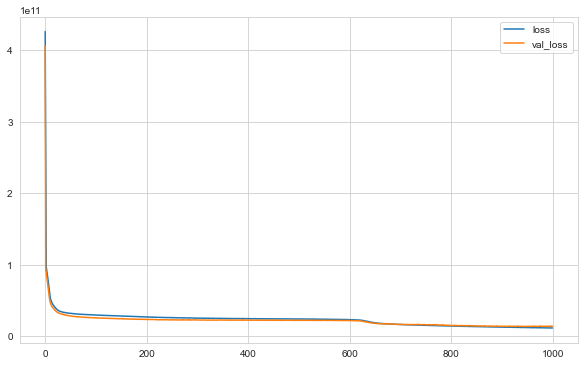

In [101]:
loss_df = pd.DataFrame(model.history.history)
loss_df.plot()

In [102]:
y_pred = model.predict(X_test)

In [103]:
eval_metric(y_test, y_pred)

r2_score: 0.8903698038795858 
mae: 71581.78462818287 
mse: 14085261498.673355 
rmse: 118681.3443582156


In [104]:
model.save('model_kc_house.h5')  # creates a D5 file 'my_model.h5'

## Loading Model and Scaler

In [105]:
from tensorflow.keras.models import load_model

In [106]:
model_kc_house = load_model('model_kc_house.h5')
scaler_kc_house = pickle.load(open("scaler_kc_house", "rb"))

## Prediction

In [107]:
single_house = df.drop('price', axis = 1).iloc[0:1, :]
single_house

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
0,3,1.000,1180,5650,1.000,0,0,3,7,1180,0,1955,0,47.511,-122.257,1340,5650,0,0,0,0,0,0,0,0,0,1,0,0


In [108]:
single_house = scaler_kc_house.transform(single_house)
single_house

array([[0.2       , 0.06666667, 0.06150342, 0.00307611, 0.        ,
        0.        , 0.        , 0.5       , 0.4       , 0.08960177,
        0.        , 0.47826087, 0.        , 0.57149751, 0.21760797,
        0.15304348, 0.00573322, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 1.        , 0.        , 0.        ]])

In [109]:
model_kc_house.predict(single_house)

array([[223894.02]], dtype=float32)

In [110]:
df.iloc[0][0]

221900.0

## Comparison with ML

In [ ]:
# eger ML de nasil sonuclar aliriz diye bakarsak

### Linear Regression

In [111]:
from sklearn.linear_model import LinearRegression 

In [112]:
ln_model = LinearRegression()
ln_model.fit(X_train, y_train)
y_pred = ln_model.predict(X_test)
eval_metric(y_test, y_pred)

r2_score: 0.7166624862631064 
mae: 122499.89722222222 
mse: 36403136312.7787 
rmse: 190796.0594791693


### Random Forest

In [113]:
from sklearn.ensemble import RandomForestRegressor

In [114]:
rf_model = RandomForestRegressor(random_state = seed)
rf_model.fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
eval_metric(y_test, y_pred)

#DL de yaptigimizdan daha iyi sonuc verdi ama, bu data cok büyük olsaydi DL daha iyi olacakti

r2_score: 0.8886293030442941 
mae: 64785.36375462963 
mse: 14308880631.643038 
rmse: 119619.73345415479


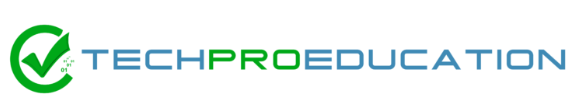